In [1]:
from pymongo import ASCENDING, GEOSPHERE, MongoClient
import pandas as pd
from alive_progress import alive_bar
from shapely.geometry import Point, mapping
from keplergl import KeplerGl
import shapely
import json
from os import listdir
from os.path import isfile, join
from tqdm import tqdm
import geopandas as gpd
from h3 import h3
import math
import sklearn
import numpy as np
import time

In [2]:
client = MongoClient('mongodb://localhost:27017/')
db = client.osmDataDB
coll_results = db.experimentsResultsBalancedRFPrecRec
# coll_results_rf = db.experimentsResultsBalancedRF

In [3]:
coll_results.find({}).distinct('city')

['Barcelona', 'Berlin', 'Budapest', 'Poznań', 'Prague', 'Warszawa', 'Wrocław']

In [4]:
# 58 59 46 47 3 2 10
# Barcelona, Berlin, Budapest, Poznań, Prague, Warsaw, Wrocław
results = [r for r in coll_results.find({'city': { '$in': ['Barcelona', 'Berlin', 'Budapest', 'Poznań', 'Prague', 'Warszawa', 'Wrocław']}})]
# results_rf = [r for r in coll_results_rf.find({'city': { '$in': ['Barcelona', 'Berlin', 'Budapest', 'Poznań', 'Prague', 'Warsaw', 'Wrocław']}})]

In [5]:
len(results)

1008

In [19]:
# neighbour_embedding_cls_dict = {
#     'AverageDiminishingSquqredNeighbourEmbedding': 'Average Diminishing Squared Neighbour Embedding',
#     'ConcatenateNeighbourEmbedding': 'Concatenate Neighbour Embedding',
#     'AverageDiminishingNeighbourEmbedding': 'Average Diminishing Neighbour Embedding',
#     'AverageNeighbourEmbedding': 'Average Neighbour Embedding',
# }
processing_dict = {
    # 'None': 'None',
    'MinMaxScaler': 'Normalisation',
    # 'StandardScaler': 'Standardisation'
}
clf_dict = {
    'RandomForestClassifier': 'Normal',
    'BalancedRandomForestClassifier': 'Balanced',
    'BalancedSubsampleRandomForestClassifier': 'Balanced\nSubsample'
}
# processing_dict_rev = {
#     0: 'None',
#     1: 'Normalization',
#     2: 'Standardization'
# }
neighbour_embedding_cls_dict = {
    'AverageDiminishingSquqredNeighbourEmbedding': 'Average Diminishing Squared',
    'ConcatenateNeighbourEmbedding': 'Concatenate',
    # 'AverageDiminishingNeighbourEmbedding': 'Average Diminishing',
    # 'AverageNeighbourEmbedding': 'Average',
}
embedding_cls_dict = {
    'BaseCountCategoryEmbedding': 'Count Category',
    # 'BaseShapeAnalyzerEmbedding': 'Shape Analyzer',
    # 'PerCategoryShapeAnalyzerEmbedding300': 'All Tags\nShape Analyzer [300]',
    # 'PerCategoryFilteredShapeAnalyzerEmbedding300': 'Selected Tags\nShape Analyzer [300]'
}
metric_dict = {
    'accuracy': 'Accuracy',
    'f1_score': 'F1 Score',
    'custom_metric': 'Custom metric',
    'balanced_accuracy': 'Balanced accuracy',
    'precision': 'Precision',
    'recall': 'Recall',
}
parsed_results = []
flat_parsed_results = []
for r in results:
    for it in r['results']:
        if (r['neighbours'] == 0 or r['neighbour_embedding_cls'] == 'AverageDiminishingSquqredNeighbourEmbedding') and \
            r['embedding_cls'] in embedding_cls_dict and \
            it['classfier_cls'] in clf_dict and \
            r['x_processing'] in processing_dict:
            parsed_results.append({
                'city': r['city'],
                'resolution': r['resolution'],
                'inbalance_ratio': r['inbalance_ratio'],
                'embedding_cls': embedding_cls_dict[r['embedding_cls']],
                'neighbours': r['neighbours'],
                'neighbour_embedding_cls': neighbour_embedding_cls_dict[r['neighbour_embedding_cls']],
                'processing': processing_dict[r['x_processing']],
                'classfier_cls': clf_dict[it['classfier_cls']],
                'iteration': it['iteration'],
                'dataset_type': it['dataset_type'],
                'Accuracy': it['accuracy'],
                'F1 Score': it['f1_score'],
                'Custom metric': it['custom_metric']
            })
            for metric in ['accuracy', 'custom_metric', 'f1_score', 'balanced_accuracy', 'precision', 'recall']:
                flat_parsed_results.append({
                    'city': r['city'],
                    'resolution': r['resolution'],
                    'inbalance_ratio': r['inbalance_ratio'],
                    'embedding_cls': embedding_cls_dict[r['embedding_cls']],
                    'neighbours': r['neighbours'],
                    'neighbour_embedding_cls': neighbour_embedding_cls_dict[r['neighbour_embedding_cls']],
                    'processing': processing_dict[r['x_processing']],
                    'classfier_cls': clf_dict[it['classfier_cls']],
                    'iteration': it['iteration'],
                    'dataset_type': it['dataset_type'],
                    'metric': metric_dict[metric],
                    'value': it[metric],
                })

In [5]:
df = pd.DataFrame(parsed_results)

In [20]:
df_flat = pd.DataFrame(flat_parsed_results)
df_flat = df_flat.sort_values(by=['metric'])

In [7]:
for column in ['embedding_cls', 'neighbour_embedding_cls', 'classfier_cls', 'dataset_type', 'city', 'processing']:
    values = list(df[column].unique())
    print(values)
    df[f'{column}_num'] = [values.index(v) for v in df[column]]
df

['Count Category', 'Shape Analyzer', 'Selected Tags\nShape Analyzer [300]', 'All Tags\nShape Analyzer [300]']
['Average Diminishing Squared']
['KNeighborsClassifier', 'SVC', 'RandomForestClassifier', 'AdaBoostClassifier']
['test', 'validation']
['Poznań', 'Warszawa', 'Wrocław']
['None', 'Normalization', 'Standardization']


,city,resolution,inbalance_ratio,embedding_cls,neighbours,neighbour_embedding_cls,processing,classfier_cls,iteration,dataset_type,Accuracy,F1 Score,Custom metric,embedding_cls_num,neighbour_embedding_cls_num,classfier_cls_num,dataset_type_num,city_num,processing_num
0,Poznań,9,1,Count Category,1,Average Diminishing Squared,None,KNeighborsClassifier,1,test,0.804348,0.804625,0.845652,0,0,0,0,0,0
1,Poznań,9,1,Count Category,1,Average Diminishing Squared,None,SVC,1,test,0.820290,0.823158,0.861594,0,0,1,0,0,0
2,Poznań,9,1,Count Category,1,Average Diminishing Squared,None,RandomForestClassifier,1,test,0.836232,0.839837,0.873879,0,0,2,0,0,0
3,Poznań,9,1,Count Category,1,Average Diminishing Squared,None,AdaBoostClassifier,1,test,0.786957,0.785167,0.827226,0,0,3,0,0,0
4,Poznań,9,1,Count Category,1,Average Diminishing Squared,None,KNeighborsClassifier,1,validation,0.828571,0.818182,0.849405,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149755,Wrocław,11,5,All Tags\nShape Analyzer [300],25,Average Diminishing Squared,Normalization,AdaBoostClassifier,10,test,0.850775,0.476034,0.858040,3,0,3,0,2,1
149756,Wrocław,11,5,All Tags\nShape Analyzer [300],25,Average Diminishing Squared,Normalization,KNeighborsClassifier,10,validation,0.899225,0.675000,0.905615,3,0,0,1,2,1
149757,Wrocław,11,5,All Tags\nShape Analyzer [300],25,Average Diminishing Squared,Normalization,SVC,10,validation,0.864341,0.363636,0.866187,3,0,1,1,2,1
149758,Wrocław,11,5,All Tags\nShape Analyzer [300],25,Average Diminishing Squared,Normalization,RandomForestClassifier,10,validation,0.887597,0.613333,0.893148,3,0,2,1,2,1


In [47]:
df_flat.neighbours.unique()

array([ 0,  1,  2,  3,  4,  6,  8, 10,  5, 15, 20, 25])

In [12]:
pd.options.display.max_rows = None

In [18]:
for res in [9, 10, 11]:
        filtered_df = df_flat.loc[
                (df_flat.dataset_type == 'validation') \
                & (df_flat.classfier_cls == 'Normal') \
                & (df_flat.resolution == res) \
                # & (df_flat.neighbours > 0)
                ]
        grpd = filtered_df[['inbalance_ratio', 'metric', 'value']].groupby(['metric', 'inbalance_ratio']).mean().reset_index()
        grpd = grpd.pivot(index=['metric'], columns=['inbalance_ratio'], values='value')
        print('res', res)
        print(grpd.round(3))
    

res 9
inbalance_ratio      1.0    1.5    2.0    2.5    3.0    3.5    4.0    4.5  \
metric                                                                      
Accuracy           0.805  0.808  0.810  0.818  0.825  0.833  0.840  0.849   
Balanced accuracy  0.805  0.802  0.783  0.771  0.753  0.743  0.727  0.717   
Custom metric      0.853  0.852  0.850  0.854  0.858  0.864  0.868  0.874   
F1 Score           0.810  0.762  0.711  0.677  0.640  0.616  0.584  0.561   
Precision          0.789  0.757  0.724  0.708  0.690  0.674  0.664  0.657   
Recall             0.836  0.772  0.704  0.656  0.606  0.575  0.534  0.504   

inbalance_ratio      5.0  
metric                    
Accuracy           0.853  
Balanced accuracy  0.697  
Custom metric      0.876  
F1 Score           0.524  
Precision          0.646  
Recall             0.457  
res 10
inbalance_ratio      1.0    1.5    2.0    2.5    3.0    3.5    4.0    4.5  \
metric                                                                      


In [14]:
import plotly.graph_objects as go
fig = go.Figure(loc
    layout=go.Layout(height=600, width=1600),
    data=go.Parcoords(
        # line = dict(color = df['f1_score'], colorscale = 'Electric', showscale = True),
        line = dict(color = df['Custom metric'], colorscale = 'Viridis', showscale = True),
        dimensions = [
             dict(ticktext = df['city'].unique(), tickvals = df['city_num'].unique(),
                        label = 'city', values = df['city_num']),
            dict(ticktext = df['dataset_type'].unique(), tickvals = df['dataset_type_num'].unique(),
                        label = 'dataset_type', values = df['dataset_type_num']),
            dict(ticktext = df['embedding_cls'].unique(), tickvals = df['embedding_cls_num'].unique(),
                 label = 'embedding_cls', values = df['embedding_cls_num']),
            dict(ticktext = df['neighbour_embedding_cls'].unique(), tickvals = df['neighbour_embedding_cls_num'].unique(),
                 label = 'neighbour_embedding_cls', values = df['neighbour_embedding_cls_num']),
            dict(ticktext = df['classfier_cls'].unique(), tickvals = df['classfier_cls_num'].unique(),
                        label = 'classfier_cls', values = df['classfier_cls_num']),
            dict(ticktext = df['resolution'].unique(), tickvals = df['resolution'].unique(),
                        label = 'resolution', values = df['resolution']),
            dict(ticktext = df['neighbours'].unique(), tickvals = df['neighbours'].unique(),
                        label = 'neighbours', values = df['neighbours']),
            dict(ticktext = df['inbalance_ratio'].unique(), tickvals = df['inbalance_ratio'].unique(),
                        label = 'inbalance_ratio', values = df['inbalance_ratio']),loc
            dict(range = [0.5,1],
                 label = 'Accuracy', values = df['Accuracy']),
            dict(range = [0.5,1],
                 label = 'Custom metric', values = df['Custom metric']),
            dict(range = [0,1],
                 label = 'F1 Score', values = df['F1 Score'])
        ]
    )loc
)
fig.show()

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
# sns.set_theme()
sns.set_style("whitegrid")
# sns.set_style("white")

In [10]:
def vertical_mean_line(x, y, **kwargs):
    # print(x)
    # print(y)
    ax = plt.gca()
    for i, inbalance_ratio in enumerate(['1','2','3','5']):
        x_filtered = x.loc[y == inbalance_ratio]
        v = x_filtered.mean()
        # plt.axvline(v, ymin=1 - (0.25 + 0.25 * i), ymax=1 - (0.25 * i), **kwargs)
        plt.axvline(v, ymin=0.96 - (0.23 + 0.23 * i), ymax=0.96 - (0.23 * i), **kwargs)
        ax.text(0.1, 0.96 - (0.1 + 0.23 * i), f"{v:.3f}", color='k', transform=ax.get_xaxis_transform(), ha='center', va='top')
        ax.yaxis.grid(False)

def vertical_mean_line_base(x, **kwargs):
    ax = plt.gca()
    v = x.mean()
    plt.axvline(v, ymin=0.05, **kwargs)
    ax.text(v, .035, f"{v:.3f}", color='k', transform=ax.get_xaxis_transform(),
            ha='center', va='top')

<ipython-input-23-5ca9c7a14f1e>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['inbalance_ratio_str'] = filtered_df.embedding_cls.astype(str)


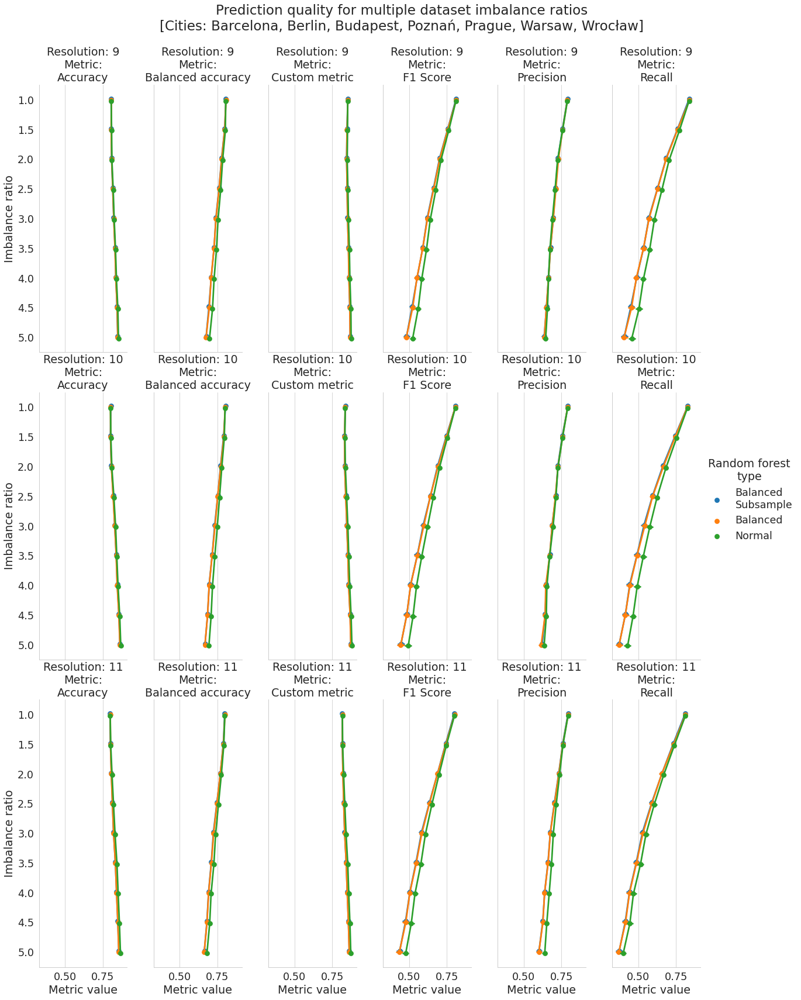

In [23]:
# sns.set_context("paper", font_scale=2, rc={"lines.linewidth": 4})
# sns.set_context("paper", font_scale=2, rc={"lines.linewidth": 2})
sns.set_context("paper", font_scale=2, rc={"lines.linewidth": 1.5})
# with sns.plotting_context(font_scale=1.5):
# for res in [9, 10, 11]:
# for metric in ['f1_score', 'accuracy', 'custom_metric']:
    # fig = plt.figure(figsize=(8.25, 11.75))
filtered_df = df_flat.loc[
    # (df_flat.city == 'Wrocław') \
    # (df_flat.resolution == res) \
    # (df_flat.resolution == res) \
    (df_flat.dataset_type == 'validation') \
    # & ((df_flat.classfier_cls == 'RandomForestClassifier') \
    # | (df_flat.classfier_cls == 'BalancedRandomForestClassifier') \
    # | (df_flat.classfier_cls =='BalancedSubsampleRandomForestClassifier')) \
    # & (df_flat.neighbours > 0) \
    # & (df_flat.inbalance_ratio == 1) \
    # & (df_flat.classfier_cls == 'RandomForestClassifier')
]
# filtered_df['emb_cls'] = filtered_df.embedding_cls.astype(str)
filtered_df['inbalance_ratio_str'] = filtered_df.embedding_cls.astype(str)
a = np.arange(len(filtered_df.embedding_cls.unique()))
# g = sns.violinplot(data=filtered_df,
#     y="value",AdaBoostClassifier
#     x="embedding_cls")
g = sns.catplot(
    data=filtered_df,
    # x="embedding_cls",
    x="value",
    # x="emb_cls",
    # x=a,
    # order="embedding_cls",
    y="inbalance_ratio",
    # y="inbalance_ratio_str",
    # y="embedding_cls",
    # hue="neighbours",
    hue="classfier_cls",
    # hue="neighbours",
    # size="neighbours",
    # linewidth=0,
    # hue="classfier_cls",
    # size="choice",
    # col="align",
    kind="point",
    dodge=True,
    # capsize=.1,
    # kind="violin",
    # kind="scatter",
    # row="metric",
    col="metric",
    row="resolution",
    # size_order=["T1", "T2"],
    # palette=palette,
    # palette="flare",
    height=8,
    aspect=.35,
    facet_kws=dict(sharex=False, sharey=True),
    orient="h"
)

# # # iterate over axes of FacetGrid
# for ax in g.axes.flat:
#     # labels = ax.get_xticklabels() # get x labels
#     # for i,l in enumerate(labels):
#     #     if(i%2 == 0): labels[i] = '' # skip even labels
#     # ax.set(yticks=list(embedding_cls_dict.values()))

#     ax.set_yticklabels(list(embedding_clf_dict_rev.values())) # set new labels
#     pass

# ax2.plot(a, y) #we plot y as a function of a, which parametrizes x
# g. set_ticks(a) #set the ticks to be a
# g.set_ticklabels(filtered_df['emb_cls']) # change the ticks' names to x

# g.set(xticks=a, xticklabels=filtered_df['emb_cls'])
# plt.ylim(0, 1)

# g.set_axis_labels("Density", f"Metric: {metric}")
# g.map(vertical_mean_line_base, 'value', color='k', ls='--', alpha=0.5)
# g.set_axis_labels("Embedding method", "Metric value")
g.set_axis_labels("Metric value", "Imbalance ratio")
g.set_titles("Resolution: {row_name}\nMetric:\n{col_name}")
# g.set_titles("{row_name}\nMetric: {col_name}")

g.fig.subplots_adjust(wspace=0.3, hspace=0.15)
g.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
g.fig.suptitle(f'Prediction quality for multiple dataset imbalance ratios\n[Cities: Barcelona, Berlin, Budapest, Poznań, Prague, Warsaw, Wrocław]')

# plt.legend(title='Neighbourhood size')
g._legend.set_title("Random forest\ntype")
g._legend.get_title().set_multialignment('center')
# plt.tight_layout()

plt.savefig(f'inbalance_2.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()